# Geoprostorové vizualizace

# Chloroplethová mapa

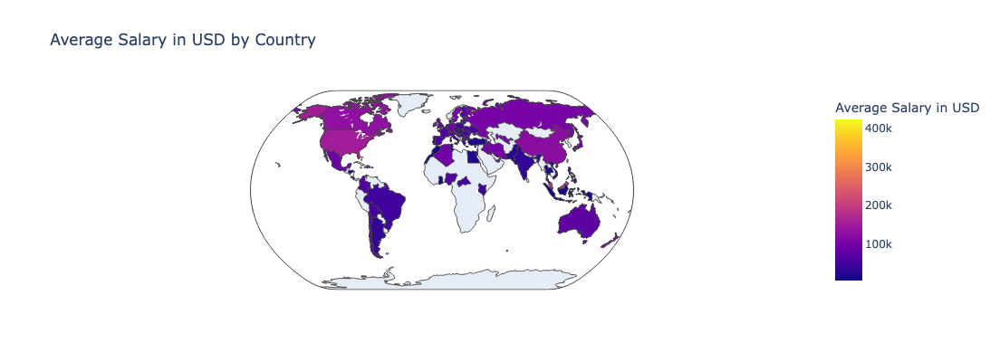

CPU times: user 80.4 ms, sys: 7.82 ms, total: 88.2 ms
Wall time: 179 ms


In [8]:
%%time
# import necessary libraries
import pandas as pd
import plotly.express as px
import pycountry

# load data stored in a CSV file
df = pd.read_csv('data/ds_salaries.csv')

# Convert two-letter country codes to three-letter codes
df['employee_residence'] = df['employee_residence'].apply(lambda x: pycountry.countries.get(alpha_2=x).alpha_3)

# Group by 'employee_residence' and calculate the average 'salary_in_usd'
avg_salaries = df.groupby('employee_residence')['salary_in_usd'].mean().reset_index()

# Create a world heatmap
fig = px.choropleth(avg_salaries, locations='employee_residence',
                    color='salary_in_usd',
                    hover_name='employee_residence',
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title='Average Salary in USD by Country',
                    labels={'salary_in_usd':'Average Salary in USD'},
                    width=800, 
                    height=400,
                    projection='natural earth')
fig.show()

# Hexbin mapa

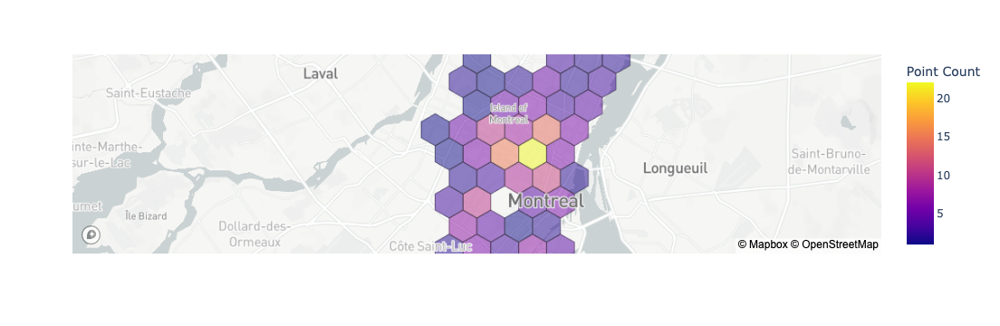

CPU times: user 1.04 s, sys: 352 ms, total: 1.39 s
Wall time: 3.82 s


In [2]:
%%time
# import necessary libraries
import plotly.figure_factory as ff
import plotly.express as px

px.set_mapbox_access_token(open("data/map_token.txt").read())
df = px.data.carshare()

fig = ff.create_hexbin_mapbox(
    data_frame=df, lat="centroid_lat", lon="centroid_lon",
    nx_hexagon=10, opacity=0.5, labels={"color": "Point Count"},
    min_count=1,
)
fig.show()


# Bubblinová mapa

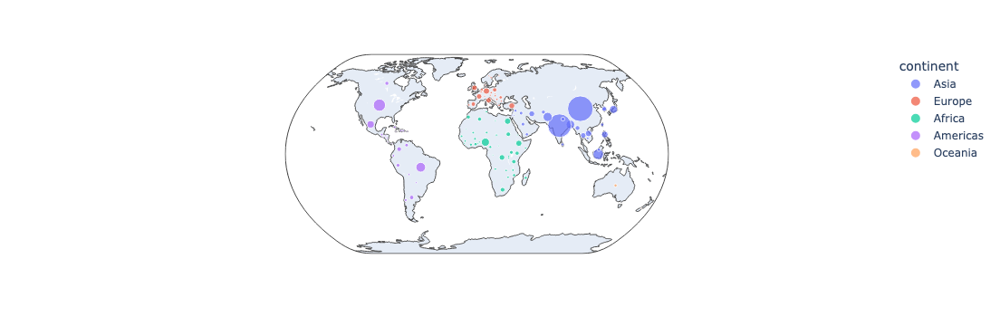

CPU times: user 138 ms, sys: 28.5 ms, total: 166 ms
Wall time: 340 ms


In [3]:
%%time
# import necessary libraries
import plotly.express as px

# data
df = px.data.gapminder().query("year==2007")

# creating map
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
                     projection="natural earth")
fig.show()

# Časové vizualizace

# Čárový graf

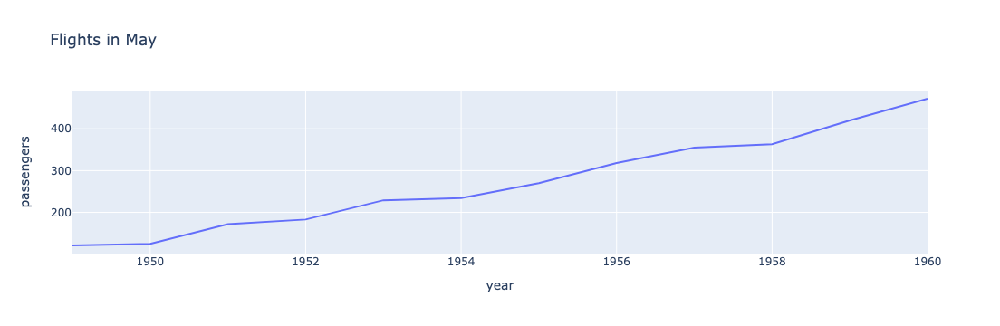

CPU times: user 2.37 s, sys: 576 ms, total: 2.95 s
Wall time: 6.25 s


In [1]:
%%time
# import necessary libraries
import pandas as pd
import plotly.express as px

# load data stored in a CSV file
df = pd.read_csv("data/flights.csv")

# Filter the data for May flights
may_flights = df[df['month'] == 'May']

# Create line plot with Plotly Express
fig = px.line(may_flights, x="year", y="passengers", title="Flights in May")

# Show plot
fig.show()


# Skládaný plošný graf

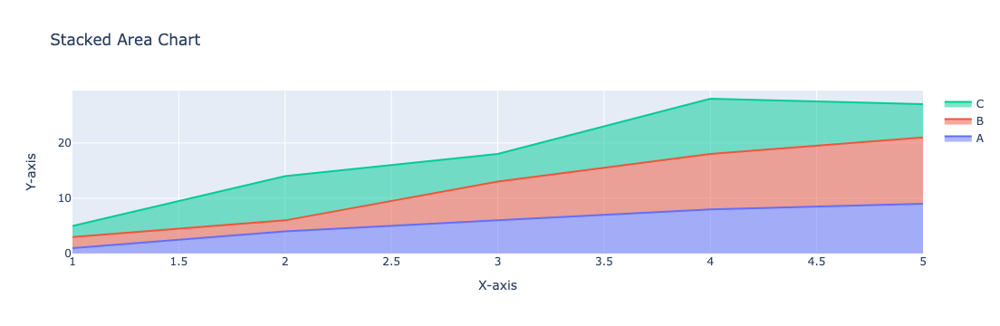

CPU times: user 15 ms, sys: 3.73 ms, total: 18.8 ms
Wall time: 36.9 ms


In [5]:
%%time
# import necessary libraries
import plotly.graph_objects as go

# Data
x = list(range(1, 6))
y = [[1, 4, 6, 8, 9], [2, 2, 7, 10, 12], [2, 8, 5, 10, 6]]
labels = ['A', 'B', 'C']

# Create a stacked area chart
fig = go.Figure()

for i in range(len(y)):
    fig.add_trace(go.Scatter(
        x=x, y=y[i], mode='lines', stackgroup='one', name=labels[i]
    ))

# Set x-axis and y-axis labels, and title
fig.update_layout(
    xaxis_title="X-axis",
    yaxis_title="Y-axis",
    title="Stacked Area Chart"
)

# Show the plot
fig.show()


# Vodopádový graf

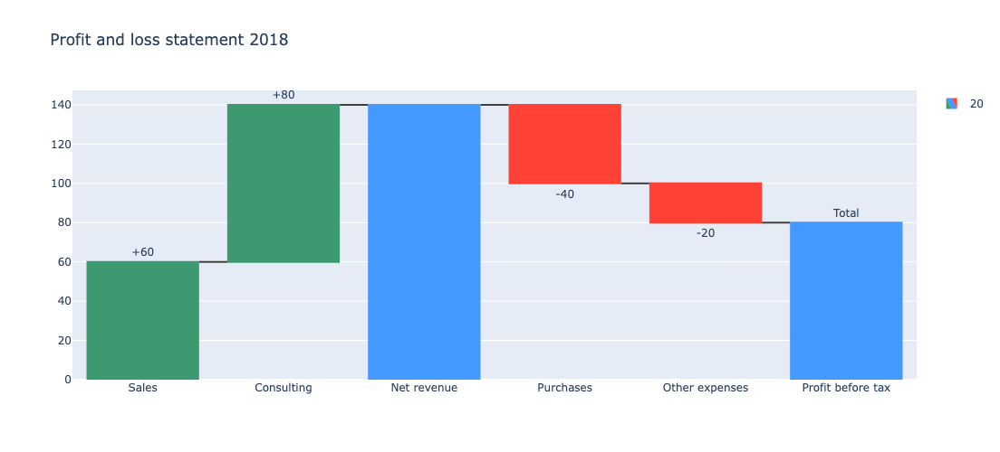

CPU times: user 18.3 ms, sys: 10.3 ms, total: 28.6 ms
Wall time: 88.5 ms


In [6]:
%%time
# import necessary libraries
import plotly.graph_objects as go

fig = go.Figure(go.Waterfall(
    name = "20", orientation = "v",
    measure = ["relative", "relative", "total", "relative", "relative", "total"],
    x = ["Sales", "Consulting", "Net revenue", "Purchases", "Other expenses", "Profit before tax"],
    textposition = "outside",
    text = ["+60", "+80", "", "-40", "-20", "Total"],
    y = [60, 80, 0, -40, -20, 0],
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
))

fig.update_layout(
        title = "Profit and loss statement 2018",
        showlegend = True,        
        width=500,  # Adjust width
        height=500,  # Adjust height

)

fig.show()

# Relační vizualizace

# Koláčový graf

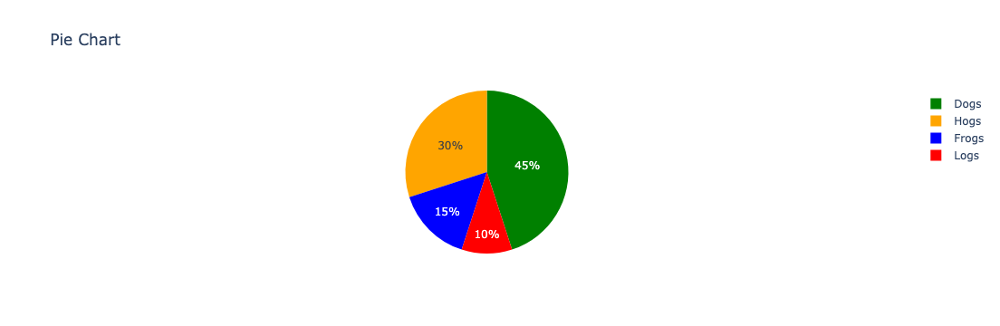

CPU times: user 10.2 ms, sys: 5.47 ms, total: 15.7 ms
Wall time: 168 ms


In [7]:
%%time
# import necessary libraries
import plotly.graph_objects as go

# declaring data 
data = [15, 30, 45, 10] 
keys = ['Frogs', 'Hogs', 'Dogs', 'Logs'] 

# define colors for the pie chart
colors = ['blue', 'orange', 'green', 'red']

# create a Pie chart figure
fig = go.Figure(data=[go.Pie(labels=keys, values=data, marker=dict(colors=colors))])

# update layout
fig.update_layout(title='Pie Chart')

# display chart
fig.show()


# Prstencový graf

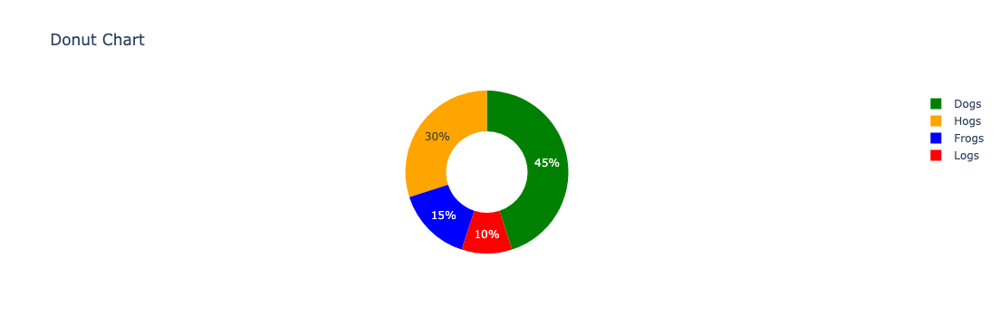

CPU times: user 9.67 ms, sys: 3.39 ms, total: 13.1 ms
Wall time: 15.3 ms


In [8]:
%%time
# import necessary libraries
import plotly.graph_objects as go

# declaring data 
data = [15, 30, 45, 10] 
keys = ['Frogs', 'Hogs', 'Dogs', 'Logs'] 

# define colors for the pie chart
colors = ['blue', 'orange', 'green', 'red']

# create pie trace
fig = go.Figure(data=[go.Pie(labels=keys, values=data, hole=0.5, marker=dict(colors=colors))])

# update layout
fig.update_layout(title='Donut Chart')

# display chart
fig.show()


# Matice bodového grafu

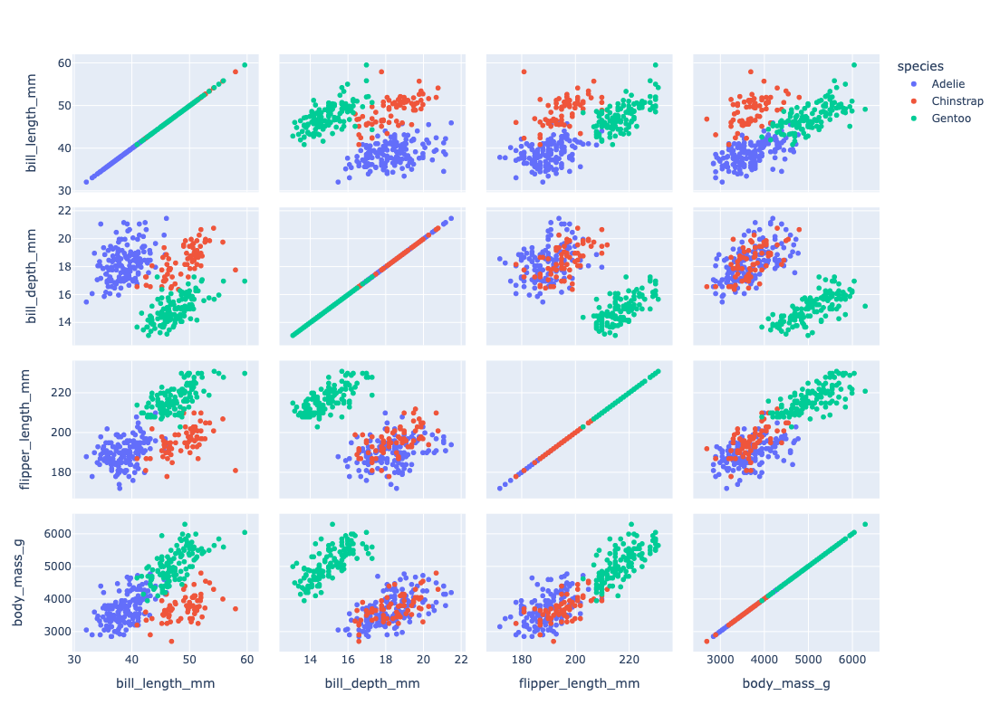

CPU times: user 490 ms, sys: 291 ms, total: 782 ms
Wall time: 2.93 s


In [2]:
%%time
# import necessary libraries
import pandas as pd
import plotly.express as px

# load data stored in a CSV file
df = pd.read_csv("data/penguins.csv")

# Define category orders
category_orders = {"species": ["Adelie", "Chinstrap", "Gentoo"]}

# Create an interactive scatter matrix plot with customized category order and larger size
fig = px.scatter_matrix(df, dimensions=["bill_length_mm", "bill_depth_mm", "flipper_length_mm", "body_mass_g"], 
                        color="species", category_orders=category_orders,
                        width=1000, height=800)  # Set width and height

# Show the plot
fig.show()

# Stromová mapa

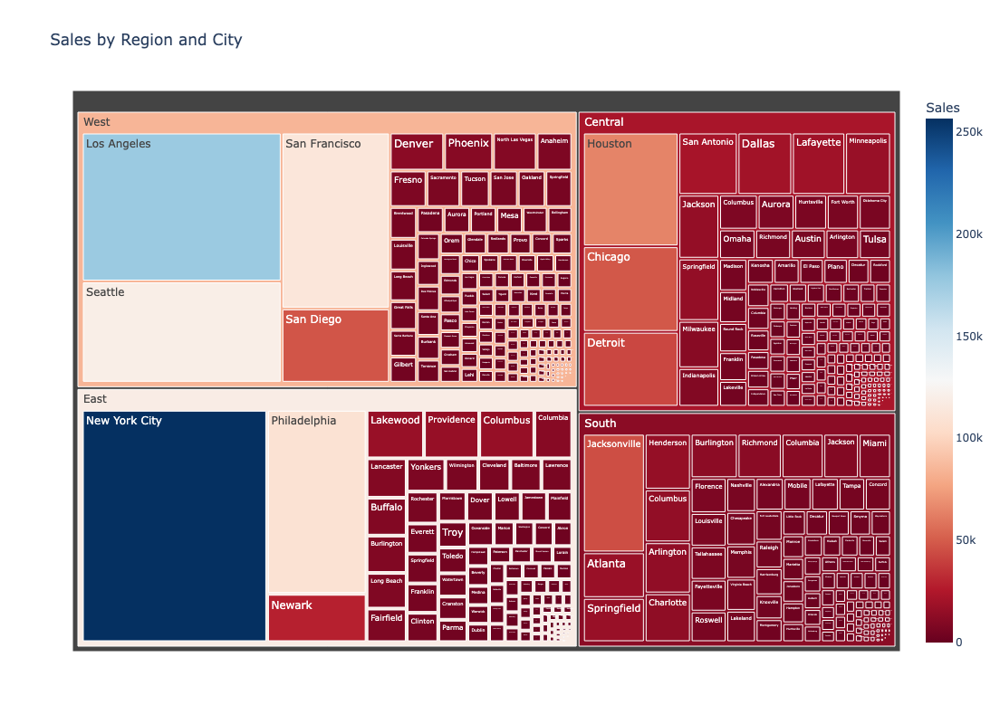

CPU times: user 961 ms, sys: 56.1 ms, total: 1.02 s
Wall time: 1.86 s


In [10]:
%%time
# import necessary libraries
import pandas as pd
import plotly.express as px

# load data stored in a CSV file
data = pd.read_csv("data/SampleSuperstore.csv")

# Prepare data
data = data[["City", "Region", "Sales"]]
regions = ("West", "Central", "South", "East")
sales_by_city = data.groupby(["Region", "City"]).sum("Sales")
sales_by_city = sales_by_city.sort_values(by="Sales").reset_index()

# Create treemap
fig = px.treemap(sales_by_city, path=['Region', 'City'], values='Sales',
                 color='Sales', hover_data=['City'],
                 color_continuous_scale='RdBu',
                 title='Sales by Region and City')

# Set the figure size
fig.update_layout(height=800, width=1200)

# Show the plot
fig.show()

# Sankeyho diagram

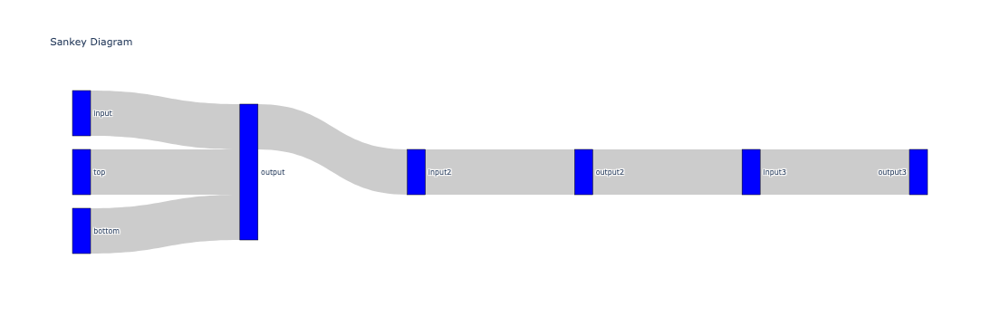

CPU times: user 20.7 ms, sys: 10.4 ms, total: 31.1 ms
Wall time: 108 ms


In [11]:
%%time
# import necessary libraries
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = ["input", "output", "top", "bottom", "input2", "output2", "input3", "output3"],
      color = "blue"
    ),
    link = dict(
      source = [2, 0, 3, 1, 4, 5, 6], # indices correspond to labels
      target = [1, 1, 1, 4, 5, 6, 7],
      value = [1, 1, 1, 1, 1, 1, 1]
  ))])

fig.update_layout(title_text="Sankey Diagram", font_size=8)
fig.show()

# Vizualizace rozdělení

# Populační pyramida

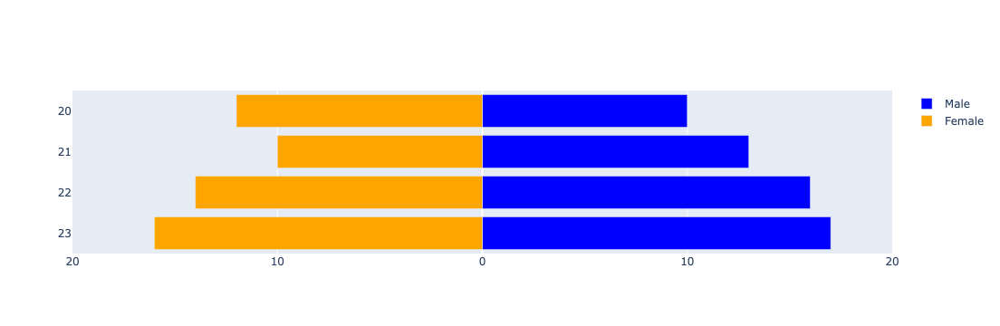

CPU times: user 14.8 ms, sys: 6.68 ms, total: 21.4 ms
Wall time: 45.1 ms


In [12]:
%%time
# import necessary libraries
import pandas as pd
import plotly.graph_objects as go

# I read this testdata from a csv file
testdata = pd.DataFrame({'age': [20, 20, 21, 21, 22, 22, 23, 23],
                'gender': ["male", "female", "male", "female", "male", "female", "male", "female"],
                'count': [10, 12, 13, 10, 16, 14, 17, 16]})

# Separate male and female data
male = testdata[testdata['gender'] == 'male']
female = testdata[testdata['gender'] == 'female']

# Create bar plots for male and female data
trace1 = go.Bar(y=male['age'], x=male['count'], orientation='h', name='Male', marker=dict(color='blue'),
                hovertemplate = 'Age: %{y}<br>Count: %{x}<extra></extra>')
trace2 = go.Bar(y=female['age'], x=-female['count'], orientation='h', name='Female', marker=dict(color='orange'),
                hovertemplate = 'Age: %{y}<br>Count: %{x}<extra></extra>')

# Create layout
layout = go.Layout(barmode='overlay', 
                   xaxis=dict(range=[-20, 20], tickvals=[-20, -10, 0, 10, 20], ticktext=[20, 10, 0, 10, 20]),
                   yaxis=dict(autorange="reversed"))

# Create figure and add traces
fig = go.Figure(data=[trace1, trace2], layout=layout)

# Show figure
fig.show()

# Histogram

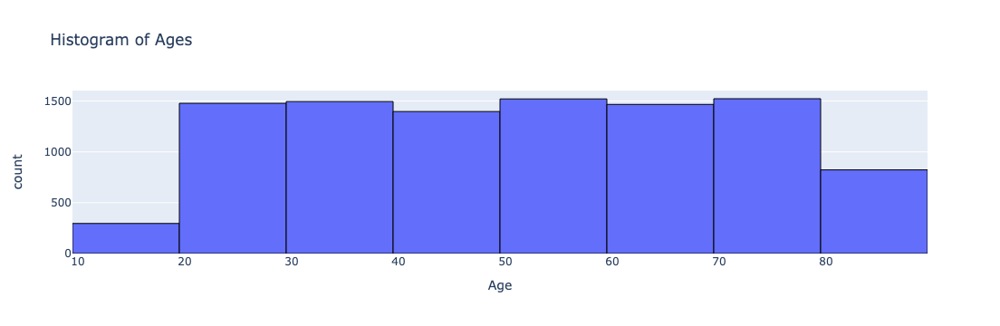

CPU times: user 159 ms, sys: 21.2 ms, total: 180 ms
Wall time: 392 ms


In [10]:
%%time
# import necessary libraries
import plotly.express as px
import pandas as pd

# load data stored in a CSV file
df = pd.read_csv('data/healthcare_dataset2.csv', sep=';')

# Create a histogram of ages
fig = px.histogram(df, x='Age', nbins=10, title='Histogram of Ages', 
                   labels={'Age': 'Age', 'count': 'Frequency'})

# Update the histogram bars to have black edges
fig.update_traces(marker=dict(line=dict(color='black', width=1)))

# Show the plot
fig.show()


# Krabicový graf

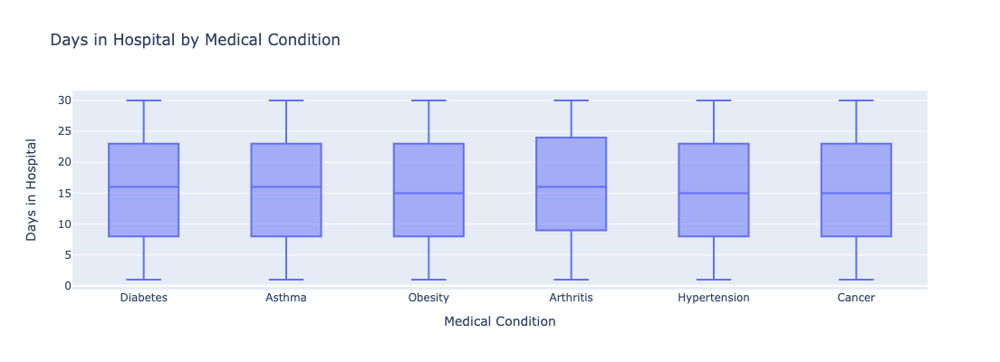

CPU times: user 171 ms, sys: 36.5 ms, total: 207 ms
Wall time: 471 ms


In [14]:
%%time
# import necessary libraries
import plotly.express as px
import pandas as pd

# load data stored in a CSV file
df = pd.read_csv('data/healthcare_dataset2.csv', sep=';')

# Create boxplot
fig = px.box(df, 
             x='Medical Condition', 
             y='Days in Hospital', 
             title='Days in Hospital by Medical Condition', 
             width=700, 
             height=400)
fig.show()

# Houslový graf

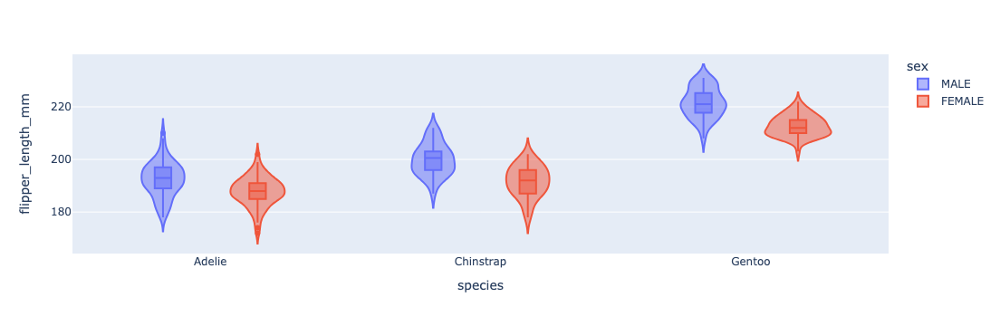

CPU times: user 118 ms, sys: 19.9 ms, total: 138 ms
Wall time: 272 ms


In [15]:
%%time
# import necessary libraries
import plotly.express as px

# load data stored in a CSV file
df = pd.read_csv("data/penguins.csv")

fig = px.violin(df, y="flipper_length_mm", x="species", color="sex", box=True,
          hover_data=df.columns)
fig.show()


# Hřebenový graf

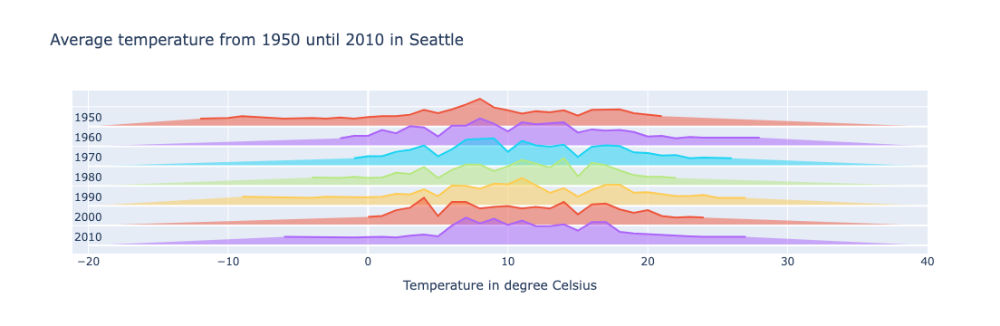

CPU times: user 262 ms, sys: 46.3 ms, total: 308 ms
Wall time: 1.39 s


In [16]:
%%time
# import necessary libraries
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# getting the data
# retrieve the data from plotly's GitHub repository
temp = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2016-weather-data-seattle.csv')
# store the year in a separate column
temp['year'] = pd.to_datetime(temp['Date']).dt.year 

# Select years to plot
year_list = [1950, 1960, 1970, 1980, 1990, 2000, 2010]
temp = temp[temp['year'].isin(year_list)]

# plot histograms-like plots for each year, group by year and mean temperature and aggregate with 'count' function
temp = temp.groupby(['year', 'Mean_TemperatureC']).agg({'Mean_TemperatureC': 'count'}).rename(columns={'Mean_TemperatureC': 'count'}).reset_index()
# the idea behind this ridgeline plot with Plotly is to add traces manually, each trace corresponding to a particular year's temperature distribution
# store each year's data (temperatures and their respective count) in seperate arrays or pd.series to retrieve them easily
array_dict = {} # instantiating an empty dictionnary
for year in year_list:
    array_dict[f'x_{year}'] = temp[temp['year']==year]['Mean_TemperatureC'] # storing the temperature data for each year
    array_dict[f'y_{year}'] = temp[temp['year']==year]['count'] # storing the temperature count for each year
    array_dict[f'y_{year}'] = (array_dict[f'y_{year}'] - array_dict[f'y_{year}'].min()) \
                                / (array_dict[f'y_{year}'].max() - array_dict[f'y_{year}'].min()) # normalize the array (min max normalization)

# create a plotly.graph_objects.Figure and add traces with fig.add_trace() method
# plot scatterplots (go.Scatter)
# iterate over year_list and create a 'blank line' that is placed at y = index, then the corresponding temperature count line
fig = go.Figure()
for index, year in enumerate(year_list):
    fig.add_trace(go.Scatter(
                            x=[-20, 40], y=np.full(2, len(year_list)-index),
                            mode='lines',
                            line_color='white'))
    
    fig.add_trace(go.Scatter(
                            x=array_dict[f'x_{year}'],
                            y=array_dict[f'y_{year}'] + (len(year_list)-index) + 0.4,
                            fill='tonexty',
                            name=f'{year}'))
    
    # plotly.graph_objects' way of adding text to a figure
    fig.add_annotation(
                        x=-20,
                        y=len(year_list)-index,
                        text=f'{year}',
                        showarrow=False,
                        yshift=10)

# modify the figure and the legend titles
fig.update_layout(
                title='Average temperature from 1950 until 2010 in Seattle',
                showlegend=False,
                xaxis=dict(title='Temperature in degree Celsius'),
                yaxis=dict(showticklabels=False) # that way you hide the y axis ticks labels
                )

fig.show()

# Kategorické vizualizace

# Sloupcový graf

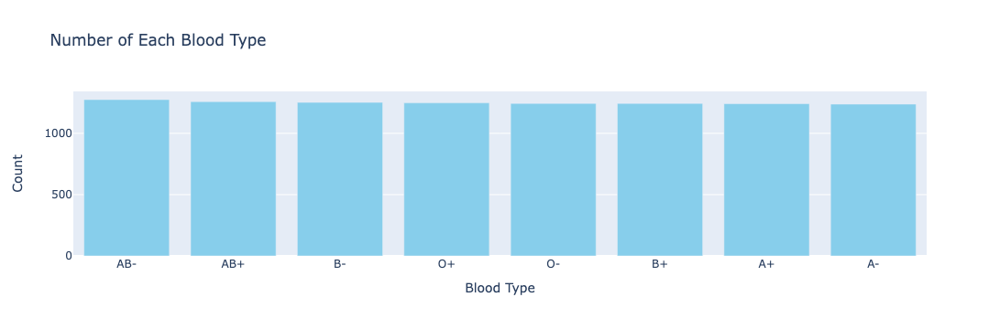

CPU times: user 72.6 ms, sys: 28.6 ms, total: 101 ms
Wall time: 208 ms


In [4]:
%%time
# import necessary libraries
import plotly.graph_objs as go
import pandas as pd

# load data stored in a CSV file
df = pd.read_csv('data/healthcare_dataset2.csv', sep=';')

# Count the occurrences of each blood type
blood_type_counts = df['Blood Type'].value_counts()

# Create a bar chart
fig = go.Figure()

# Add bar trace
fig.add_trace(go.Bar(x=blood_type_counts.index, y=blood_type_counts.values, marker_color="skyblue"))

# Update layout
fig.update_layout(
    title='Number of Each Blood Type',
    xaxis_title='Blood Type',
    yaxis_title='Count',
    xaxis=dict(type='category')
)
# Show the plot
fig.show()

# Skupinový sloupcový graf

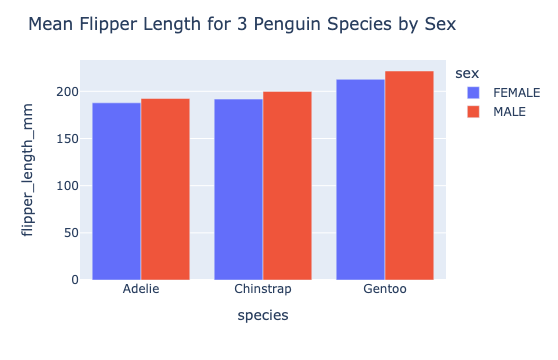

CPU times: user 115 ms, sys: 9.82 ms, total: 125 ms
Wall time: 205 ms


In [3]:
%%time
# import necessary libraries
import pandas as pd
import plotly.express as px

# load data stored in a CSV file
data = pd.read_csv('data/penguins.csv')

# Calculate the mean flipper length for each species and sex
mean_data = data.groupby(['species', 'sex'])['flipper_length_mm'].mean().reset_index()

# Create grouped bar chart
fig = px.bar(mean_data, x='species', y='flipper_length_mm', color='sex', barmode='group')

# Update figure layout
fig.update_layout(title='Mean Flipper Length for 3 Penguin Species by Sex')

# Show plot
fig.show()


# Skládaný sloupcový graf

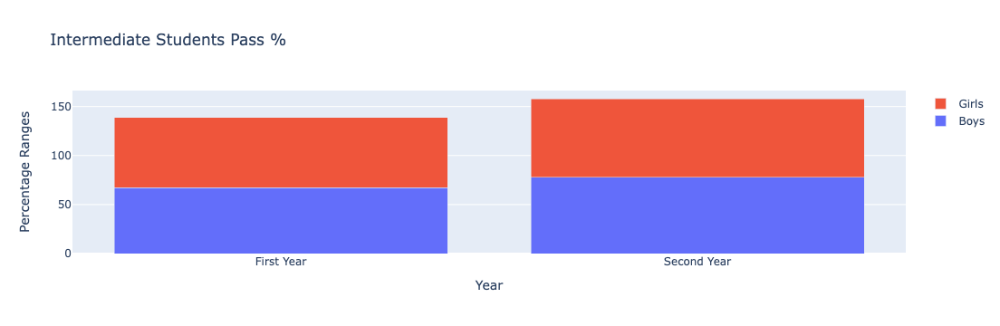

CPU times: user 2.31 s, sys: 542 ms, total: 2.86 s
Wall time: 5.44 s


In [2]:
%%time
# import necessary libraries
import plotly.graph_objects as go
import pandas as pd

# Create DataFrame
students = pd.DataFrame({"Boys": [67, 78],
                        "Girls": [72, 80], },
                        index=["First Year", "Second Year"])

# Create a trace for boys
trace1 = go.Bar(
    x=students.index,
    y=students['Boys'],
    name='Boys'
)

# Create a trace for girls
trace2 = go.Bar(
    x=students.index,
    y=students['Girls'],
    name='Girls'
)

# Create a data object
data = [trace1, trace2]

# Create a layout object
layout = go.Layout(
    barmode='stack',
    title='Intermediate Students Pass %',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Percentage Ranges')
)

# Create a figure object
fig = go.Figure(data=data, layout=layout)

# Show the figure
fig.show()

# Paprskový graf

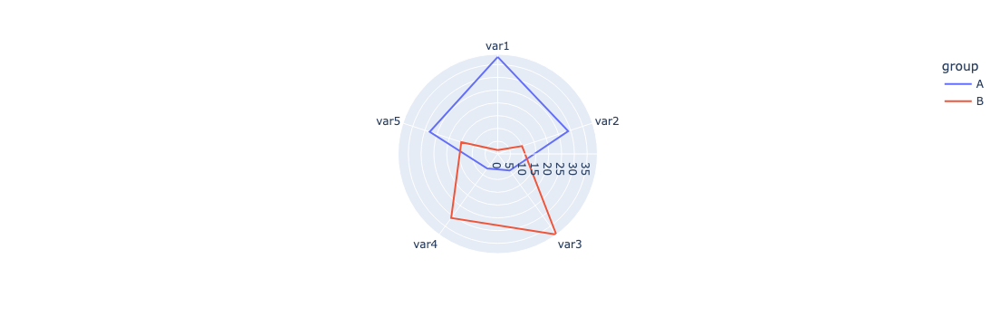

CPU times: user 96.7 ms, sys: 14.5 ms, total: 111 ms
Wall time: 343 ms


In [20]:
%%time
# import necessary libraries
import plotly.express as px
import pandas as pd

# Set data
df = pd.DataFrame({
'group': ['A','B','C','D'],
'var1': [38, 1.5, 30, 4],
'var2': [29, 10, 9, 34],
'var3': [8, 39, 23, 24],
'var4': [7, 31, 33, 14],
'var5': [28, 15, 32, 14]
})

# Reshape DataFrame
df_melt = df.melt(id_vars='group', var_name='variable', value_name='value')

# Specify groups to show
groups_to_show = ['A', 'B']

# Filter DataFrame
df_melt_filtered = df_melt[df_melt['group'].isin(groups_to_show)]

# Create radar chart
fig = px.line_polar(df_melt_filtered, r='value', theta='variable', color='group', line_close=True)
fig.show()

# Hierarchické vizualizace

# Trychtýřový graf

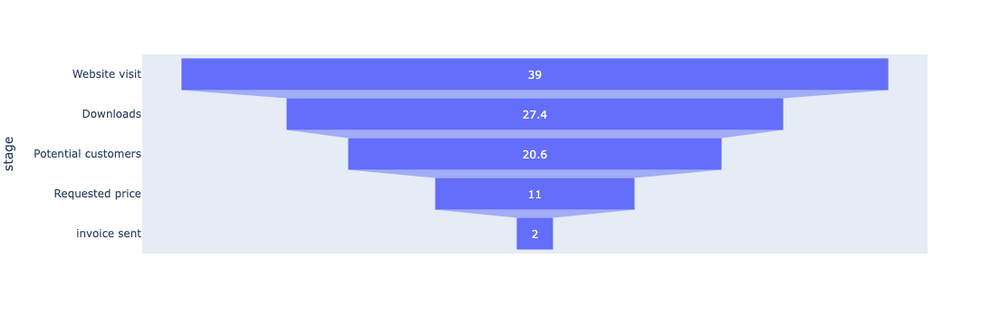

CPU times: user 66.5 ms, sys: 11.1 ms, total: 77.5 ms
Wall time: 216 ms


In [21]:
%%time
# import necessary libraries
import plotly.express as px
data = dict(
    number=[39, 27.4, 20.6, 11, 2],
    stage=["Website visit", "Downloads", "Potential customers", "Requested price", "invoice sent"])
fig = px.funnel(data, x='number', y='stage')
fig.show()

# Ganttův diagram

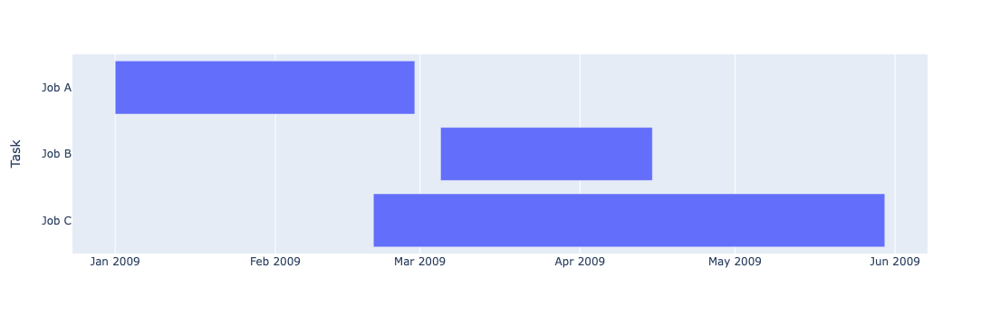

CPU times: user 108 ms, sys: 9.47 ms, total: 117 ms
Wall time: 223 ms


In [22]:
%%time
# import necessary libraries
import plotly.express as px
import pandas as pd

df = pd.DataFrame([
    dict(Task="Job A", Start='2009-01-01', Finish='2009-02-28'),
    dict(Task="Job B", Start='2009-03-05', Finish='2009-04-15'),
    dict(Task="Job C", Start='2009-02-20', Finish='2009-05-30')
])

fig = px.timeline(df, x_start="Start", x_end="Finish", y="Task")
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()

# Teplotní mapa

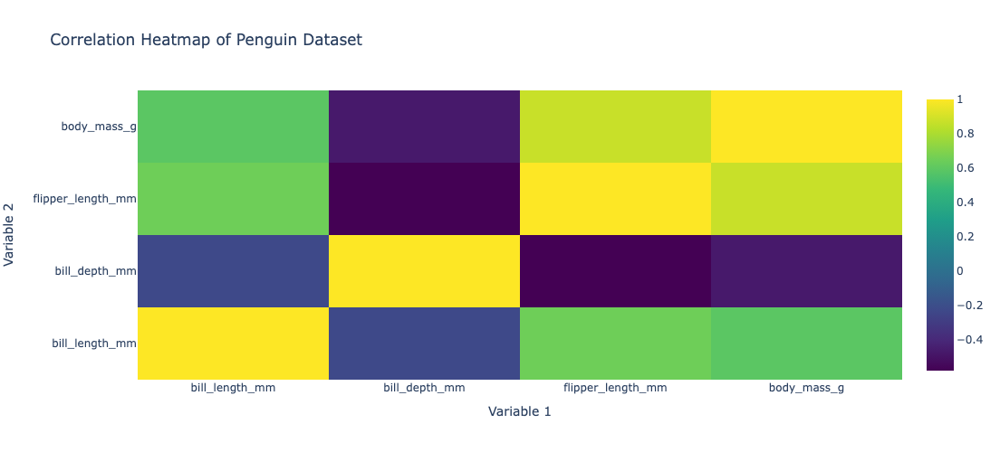

CPU times: user 18.4 ms, sys: 13.1 ms, total: 31.5 ms
Wall time: 178 ms


In [4]:
%%time
# import necessary libraries
import pandas as pd
import plotly.graph_objects as go

# load data stored in a CSV file
df = pd.read_csv("data/penguins.csv")

# Remove NaN values
df = df.dropna()

# Extract numeric columns for heatmap
numeric_data = df.select_dtypes(include=['float64'])

# Calculate correlation matrix
corr_matrix = numeric_data.corr().round(2)

# Define the trace
trace = go.Heatmap(z=corr_matrix.values,
                   x=corr_matrix.columns,
                   y=corr_matrix.index,
                   hovertemplate='Correlation: %{z}<extra></extra>',
                   colorscale='Viridis')

# Define the layout with larger dimensions
layout = go.Layout(title="Correlation Heatmap of Penguin Dataset",
                   xaxis=dict(title="Variable 1"),
                   yaxis=dict(title="Variable 2"),
                   width=500,  
                   height=500)  

# Create the figure
fig = go.Figure(data=[trace], layout=layout)

# Show the figure
fig.show()


# Sluneční diagram

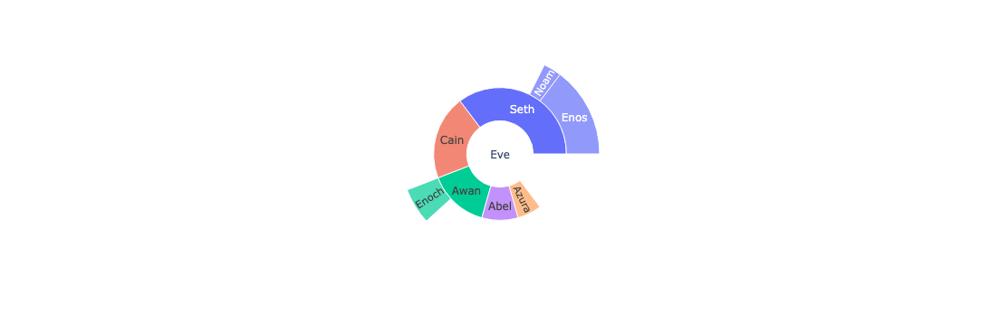

CPU times: user 60.6 ms, sys: 10.5 ms, total: 71.1 ms
Wall time: 128 ms


In [24]:
%%time
# import necessary libraries
import plotly.express as px
data = dict(
    character=["Eve", "Cain", "Seth", "Enos", "Noam", "Abel", "Awan", "Enoch", "Azura"],
    parent=["", "Eve", "Eve", "Seth", "Seth", "Eve", "Eve", "Awan", "Eve" ],
    value=[10, 14, 12, 10, 2, 6, 6, 4, 4])

fig = px.sunburst(
    data,
    names='character',
    parents='parent',
    values='value'
)
fig.show()

# Strunový diagram

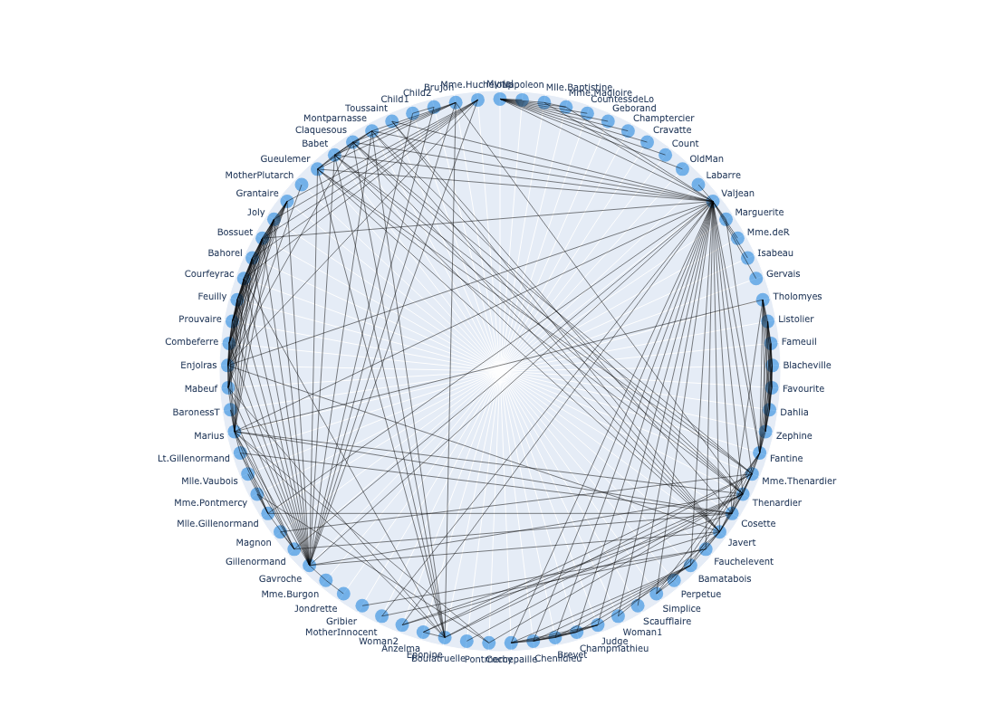

CPU times: user 237 ms, sys: 19.2 ms, total: 256 ms
Wall time: 378 ms


In [25]:
%%time
# import necessary libraries
import pandas as pd
import plotly.graph_objects as go
from bokeh.sampledata.les_mis import data

# Data set
nodes = pd.DataFrame(data['nodes'])
links = pd.DataFrame(data['links'])

# Create a list of node names
names = nodes['name'].tolist()

# Create a list of node colors
colors = ['rgba(0, 116, 217, 0.5)' for _ in range(len(names))]

# Create a scatterpolar trace for the nodes
trace_nodes = go.Scatterpolar(
    r=[1 for _ in range(len(names))],
    theta=names,
    mode='markers',
    marker=dict(color=colors, size=15),
    text=names,
    hoverinfo='text'
)

# Create a scatterpolar trace for the links
trace_links = []
for _, link in links.iterrows():
    trace_links.append(
        go.Scatterpolar(
            r=[1, 1, None],
            theta=[names[link['source']], names[link['target']], None],
            mode='lines',
            line=dict(color='black', width=0.5),
            hoverinfo='none'
        )
    )

# Create a layout
layout = go.Layout(
    showlegend=False,
    hovermode='closest',
    width=800,  # Adjust the width of the plot
    height=800,  # Adjust the height of the plot
    polar=dict(
        radialaxis=dict(visible=False),
        angularaxis=dict(rotation=90, direction='clockwise', tickfont=dict(size=10))
    )
)

# Create a figure
fig = go.Figure(data=[trace_nodes] + trace_links, layout=layout)

# Show the figure
fig.show()

# Bublinový graf

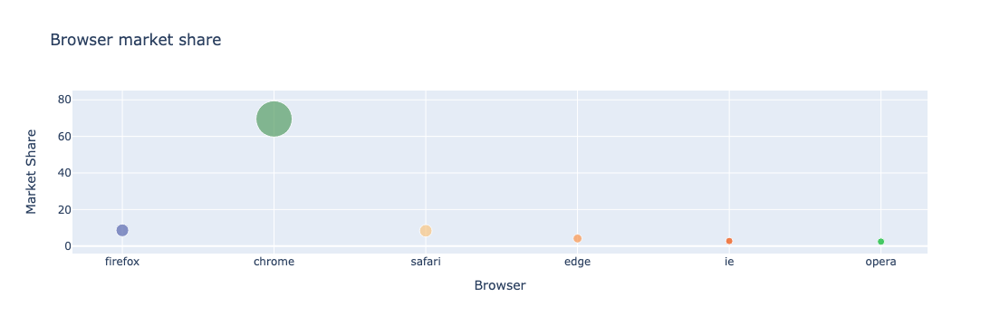

CPU times: user 12.9 ms, sys: 5.4 ms, total: 18.3 ms
Wall time: 36.9 ms


In [26]:
%%time
# import necessary libraries
import plotly.graph_objects as go

# Data
browser_market_share = {
    'browsers': ['firefox', 'chrome', 'safari', 'edge', 'ie', 'opera'],
    'market_share': [8.61, 69.55, 8.36, 4.12, 2.76, 2.43],
    'color': ['#5A69AF', '#579E65', '#F9C784', '#FC944A', '#F24C00', '#00B825']
}

# Create a bubble chart
fig = go.Figure(data=[go.Scatter(
    x=browser_market_share['browsers'], 
    y=browser_market_share['market_share'],
    mode='markers',
    marker=dict(
        color=browser_market_share['color'],
        size=browser_market_share['market_share'], # sets size of markers
        sizemode='area', # size of markers corresponds to area
        sizeref=2.*max(browser_market_share['market_share'])/(40.**2), # scale marker size
        sizemin=4 # minimum marker size
    ),
    text=browser_market_share['browsers'] # hover text goes here
)])

fig.update_layout(
    title='Browser market share',
    xaxis=dict(title='Browser'),
    yaxis=dict(title='Market Share'),
    showlegend=False
)

fig.show()